## Import des librairies et installations librairies / packages

In [1]:
print("Let begin....")

Let begin....


**Importation des packages**

In [2]:
import platform
print(platform.python_version()) 

!pip install torch torchvision #normalement il est déjà installé avec les dernières versions de Google Colab
import torch

!pip install fastai #normalement il est déjà installé avec les dernières versions de Google Colab
import fastai


3.7.11


In [3]:
from fastai.vision import *  
import warnings 
warnings.filterwarnings('ignore')

## Remontée du Drive et navigation dans le Drive avec Google Colab



**Connexion entre Google Colab et Google Drive**

In [4]:
from google.colab import drive 
drive.mount('/content/gdrive', force_remount=True)

Mounted at /content/gdrive


A ce stade le Drive Google est bien connecté et nous allons pouvoir donner des instructions à Google Colab pour naviguer dans le Drive et ainsi avoir accès à nos images de guitare ;)


In [5]:
# Ou sommes-nous dans le drive ?
!pwd 

/content


In [6]:
# Position dans le Drive Google

%cd /content/gdrive/MyDrive/fastai-v3/image/

/content/gdrive/.shortcut-targets-by-id/1upFq34tBNfQI31GmWuX4HJw2j3MOrV7F/fastai-v3/image


In [8]:
#Liste tout ce qui est présent dans le répertoire
!ls 

export.pkl  stratocaster  telecaster


In [7]:
# On verifie si les images sont dans le bon format pour fastai sinon les supprimer 
verify_images('stratocaster', delete=True, max_workers=8) 

In [9]:
verify_images('telecaster', delete=True, max_workers=8)

## Création du "DataBunch"

Un "**DataBunch**" est en quelque sorte une classe dans **fastai** qui charge et les données d'entrainement et de validation.


In [10]:
doc(ImageDataBunch) #Permet d'accéder à la documentation Fast.ai sur la classe DataBunch

**Création d'un chemin d'accès interprétable par Fast.ai**

In [11]:
path = Path("/content/gdrive/MyDrive/fastai-v3/image/")  #création d'un chemin d'accès interprétable par Fast.ai 

- Cette étape est primordiale et assez spécifique à Fast.ai. Elle va permettre d'intérpréter les images de chacun des fichiers (stratocaster et telecaster), d'attribuer les labels (en fonction des noms de fichiers). 
- Elle permet également de "splitter" le jeu de données en training et validation set (80% dedié au training set et le reste consacré au dev set : 20%).

- A la fin de la ligne de code on applique une méthode qui permet de normaliser les images


In [12]:
data = ImageDataBunch.from_folder(path, train=".", valid_pct=0.2, size=224, num_workers=4).normalize(imagenet_stats)

On a stocké les informations relatives aux images dans la variable data. On passe maintenant à l'etape 1.

- Etape 1 : on vérifier les catégories (classes) => elles doivent correspondre en toute logique à nos 2 modèles de guitares


In [13]:
data.classes

['stratocaster', 'telecaster']

Ensuite, nous pouvons visualiser un échantillon via show_batch 
- Le **3** permet d'indiquer le nombre d'image sur chaque côté d'une matrice carrée (3*3 images)  donc au totale 9 images.
- **figsize** permet de contrôler la taille d'affichage des images
 
*on contrôle bien que les labels sont corrects à ce stade*.

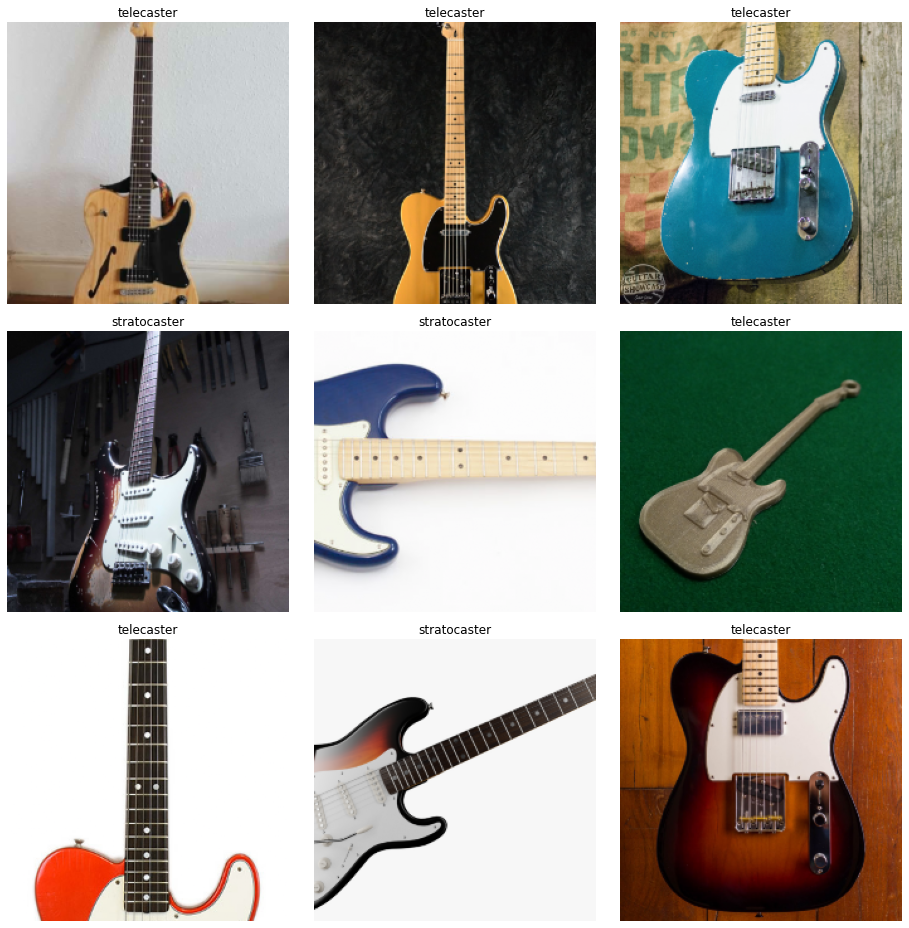

In [14]:
data.show_batch(rows=3, figsize=(13,13))

In [15]:
data.c, len(data.train_ds), len(data.valid_ds) # On regarde le nombre d'images présentes dans les training et dev set

(2, 740, 184)

 - On a 740 images d'entrainement et 184 images de validation reparties en deux classes différentes.

## Entraînement / Apprentissage du modèle (RESNET34)

Maintenant, on passe aux choses encore plus serieuses : notre modèle **RESNET**.


Mise en place d'un modèle convolutionnel de type **Resnet34** avec une métrique d'évaluation de l'erreur


In [16]:
learn = cnn_learner(data, models.resnet34, metrics=error_rate)

**Entrainement du modèle**

In [17]:
learn.fit_one_cycle(4) 

epoch,train_loss,valid_loss,error_rate,time
0,0.940370,0.688075,0.233696,00:52
1,0.694723,0.747569,0.206522,00:52
2,0.502070,0.765339,0.190217,00:52
3,0.393294,0.767688,0.184783,00:53


**Commentaire** :
- _On entraine le modèle sur 4 cycles (epoch) qui est le nombre de tour d'apprentissage optimal_.
- On voit que le taux d'erreur a tendance à diminuer (notre modèle apprend et devient plus efficace dans la reconnaissance de nos modèles de guitares !)
- Importance du nombre d'epoch : basiquement, plus le nombre d'epoch augmente, plus le modèle fait de "tours d'apprentissage". Mais ça ne signifie pas qu'il doit être trop important.
   - Si le nombre d'epoch trop grand, alors le train_loss peut continuer à diminuer mais on peut voir le valid_loss augmenter: ce sont les symptômes d'un sur-apprentissage (**over-fitting**) ! Le modèle est excellent pour reconnaître les images sur lesquelles il s'est entraîné.Mais il n'arrive plus à sortir de sa zone de confort et s'adapter à de nouvelles images !   
   - De meme, si le nombre d'epoch est trop petit, le modele sous-apprend (**under-fitting**). Le modèle ne serait pas capable de reconnaitre les images du training et du test set.    

- Choisir un nombre d'epochs entre **2**et **5** permet en principe d'être efficace dans **98%** des cas et de prémunir du sur-apprentissage !

In [18]:
learn.model_dir  = '/content/gdrive/My Drive/' #permet d'enregistrer les paramètres du modèle sur la page d'accueil de  Drive Google
learn.save('stage-1') #Cette ligne permet de bien s'assurer qu'on enregistre cette étape

In [19]:
learn.unfreeze() #permet de débloquer les paramètres du système

Observons le taux d'erreur en fonction du "learning rate" (taux d'apprentissage)

LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


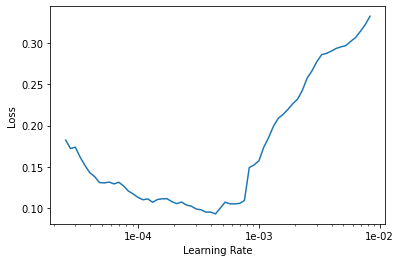

In [20]:
learn.lr_find(start_lr=1e-5, end_lr=1e-1)
learn.recorder.plot()

Au vu du graphique, on remarque qu'on peut reduire la borne inferieur du leraning rate **start_lr** à **1e-5** et la borne supérieure à **end_lr=1e-3**.

LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


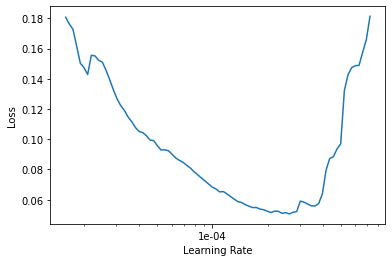

In [24]:
learn.lr_find(start_lr=1e-5, end_lr=1e-3)                             
learn.recorder.plot()  

En fonction du graphique et du comportement du taux d'erreur en fonction du learning rate, on choisit :

In [27]:
learn.fit_one_cycle(4, max_lr=slice(1e-5, 1e-4))   

epoch,train_loss,valid_loss,error_rate,time
0,0.044611,0.861419,0.103261,00:51
1,0.029988,0.851333,0.108696,00:52
2,0.020130,0.822196,0.103261,00:51
3,0.013997,0.825853,0.103261,00:52


In [28]:
learn.save('stage-2')

## Entraînement / Apprentissage du modèle (RESNET50)

**Mise en place notre modèle avec RESNET 50**

In [29]:
learn2 = cnn_learner(data, models.resnet50, metrics=error_rate)  

Downloading: "https://download.pytorch.org/models/resnet50-0676ba61.pth" to /root/.cache/torch/hub/checkpoints/resnet50-0676ba61.pth


  0%|          | 0.00/97.8M [00:00<?, ?B/s]

**Entraînons notre modèle avec 4 EPOCHS**

In [30]:
learn2.fit_one_cycle(4) 

epoch,train_loss,valid_loss,error_rate,time
0,0.895249,0.840081,0.179348,00:58
1,0.592952,0.879119,0.168478,00:56
2,0.409720,0.745942,0.146739,00:54
3,0.294094,0.665100,0.141304,00:53


**Enregistrement des paramètres du modèle sur la page d'accueil du Drive Google.**

In [31]:
learn2.model_dir= '/content/gdrive/My Drive/'  
learn2.save('stage-1')

In [32]:
learn2.unfreeze() #permet de débloquer les paramètres 

LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


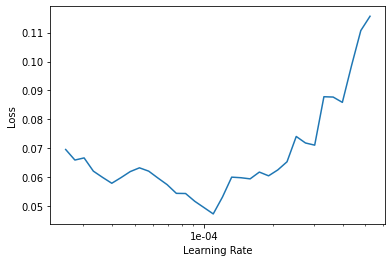

In [33]:
# Observons le taux d'erreur en fonction de l'hyperparamètre sur lequel nous pouvons jouer ("learning rate")

learn2.lr_find(start_lr=1e-5, end_lr=1e-1)
learn2.recorder.plot()

In [34]:
learn2.fit_one_cycle(4, max_lr=slice(1e-4 ,1e-3 ))  #Entraînons de nouveau le modèle avec 4 EPOCHS et des bornes pour le LEARNING RATE

epoch,train_loss,valid_loss,error_rate,time
0,0.190850,0.892955,0.173913,00:56
1,0.234779,2.429800,0.184783,00:58
2,0.217458,0.868883,0.108696,00:55
3,0.185735,0.622296,0.114130,00:54


In [35]:
learn2.save('stage-2')

- On peut également jouer sur le paramètre **epoch**.
On peut remarquer que le modèle gère deja bien la classification avec un taux d'erreur de **11%** d'ou une fiabilité approximative de **89%**.

## Comment intérpréter les résultats ? 

Telechargement des paramètres 

In [36]:
learn2.load('stage-2')

Learner(data=ImageDataBunch;

Train: LabelList (740 items)
x: ImageList
Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224)
y: CategoryList
stratocaster,stratocaster,stratocaster,stratocaster,stratocaster
Path: /content/gdrive/MyDrive/fastai-v3/image;

Valid: LabelList (184 items)
x: ImageList
Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224)
y: CategoryList
stratocaster,telecaster,stratocaster,stratocaster,telecaster
Path: /content/gdrive/MyDrive/fastai-v3/image;

Test: None, model=Sequential(
  (0): Sequential(
    (0): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (4): Sequential(
      (0): Bottleneck(
        (conv1): Conv2d(64, 64, kernel_size=(1, 1), 

On voit que le modèle **RESNET** est relativement complexe avec plusieurs couche de convolution.

**Interpretation des résultats RESNET50**

In [37]:
interp = ClassificationInterpretation.from_learner(learn2)  

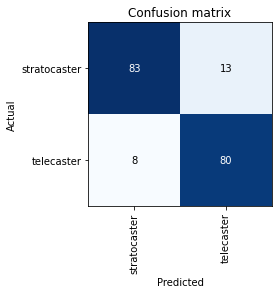

In [38]:
interp.plot_confusion_matrix()  

Analyse de la matrice de confusion est importante, car elle permet de nous donner des indications sur les erreurs faîtes par notre modèle. 
- Parmi les erreurs, y a t il 13 **stratocaster** qui ne sont pas reconnus comme tels (donc comme des **telecaster** !) respectivement 8 **telecaster** qu'il classe comme **stratocaster**.

Important : pour optimiser le modèle, on peut peut être relabelliser des images non pertinentes... 

## Prédictions sur de nouvelles images 

Un fichier nommé export.pkl est créé dans le répertoire dans lequel nous travaillons. Dans ce fichier, toutes les informations du modèles vont être stockées (les poids de chacun des paramètres du réseau de neurones, le type de modèle (ici modèle convolutionnel resnet34), les procédés de normalisation (Adam Normalization, dropout etc...)
Nous allons utilisé le modèle que j'ai entraîné précédemment pour faire la prédiction.

In [39]:
# Si on veut réutiliser le code pour un autre classificateur d'images
#learn2.export()   

**Test sur une guitare TELECASTER**

Dans cette partie, on va pouvoir effectuer des prédictions avec notre modèle.


Chargement de l'image.

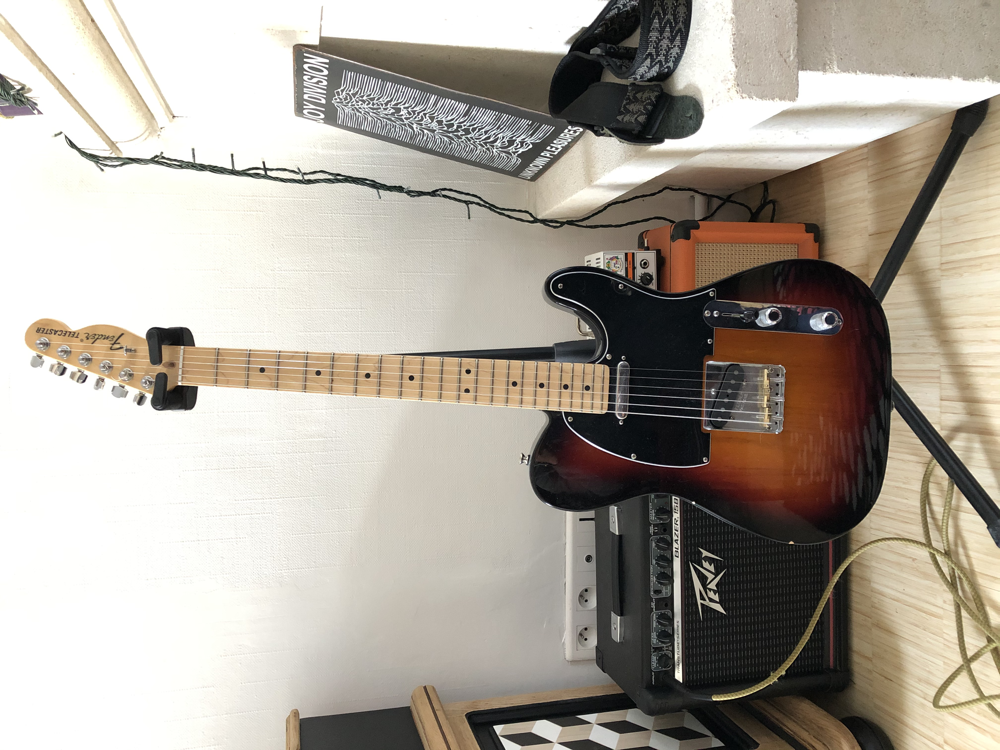

In [40]:
img = open_image('/content/gdrive/My Drive/fastai-v3/testsurmaguitare.jpg')   #création d'une image à travers le chemin donnant accès à l'mage test de ma guitare 
img

**Nous devons ensuite créer "l'environnement de production" comme suit:**

In [42]:
# On doit s'assurer au préalable que le chemin (path) contient bien le fichier "export.pkl" qui contient tous les paramètres et métadonnées de notre modèle !
learn = load_learner('/content/gdrive/My Drive/fastai-v3/image/')

Nous demandons à notre modèle d'effectuer une prédiction sur une guitare qu'il n'a jamais vu.
 - En sortie **learn.predict(img)** me donne la catégorie du "tenseur" => vecteur de sortie qui contient les probabilités d'appartenance à une des 2 classes selon le modèle.

Le tenseur 0 correspond au modèle de guitare **stratocaster** et le tenseur 1 correspond au modèle de guitare **telecaster**
  - Si la probabilité du tenseur 0 > proba tenseur 1 alors le modèle classera l'image dans la catégorie **stratocaster**.
  - Inversement, si la probabilité du tenseur 1 > proba tenseur 0 alors il classera l'image dans la catégorie **telecaster**.

In [43]:
 
pred_class,pred_idx,outputs = learn.predict(img)   #Cette méthode permet d'effectuer une prédiction sur le fichier image (img)
if str(pred_idx) == 'tensor(0)':
  print("Cette guitare est une Fender STRATOCASTER")
else:
  print("Cette guitare est une Fender TELECASTER")

 #Affichage du résultat :)  (roulement de tabour !!!???!!!???)                                        

Cette guitare est une Fender TELECASTER


Le modèle prédit juste... et c'est génial !

**Fin du training ....**